# KITTI 데이터셋 분석

이 노트북은 KITTI 데이터셋의 구조와 내용을 분석합니다.

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objs as go
from scipy.spatial.transform import Rotation as R
import open3d as o3d
from PIL import Image
import cv2
from glob import glob
from pathlib import Path
import random

## 1. 데이터셋 구조 확인

In [2]:
def print_directory_structure(path, prefix=''):
    if os.path.isfile(path):
        print(f'{prefix}└── {os.path.basename(path)}')
    else:
        print(f'{prefix}└── {os.path.basename(path)}/')
        for item in os.listdir(path):
            if not item.startswith('.'):  # 숨김 파일 제외
                print_directory_structure(os.path.join(path, item), prefix + '    ')

print('KITTI 데이터셋 구조:')
print_directory_structure('KITTI_dataset')

KITTI 데이터셋 구조:
└── KITTI_dataset/
    └── calibration/
        └── 2011_09_26_drive_0001/
            └── calib_velo_to_cam.txt
            └── calib_imu_to_velo.txt
            └── calib_cam_to_cam.txt
        └── 2011_09_26_drive_0020/
            └── calib_velo_to_cam.txt
            └── calib_imu_to_velo.txt
            └── calib_cam_to_cam.txt
    └── tracklets/
        └── 2011_09_26_drive_0020_sync/
            └── tracklet_labels.xml
    └── data/
        └── 2011_09_26_drive_0001_sync/
            └── image_03/
                └── timestamps.txt
                └── data/
                    └── 0000000034.png
                    └── 0000000020.png
                    └── 0000000008.png
                    └── 0000000009.png
                    └── 0000000021.png
                    └── 0000000035.png
                    └── 0000000023.png
                    └── 0000000037.png
                    └── 0000000036.png
                    └── 0000000022.png
                    └──

### 1.1 데이터셋 경로 지정

In [3]:
dataset_prefix = "2011_09_26_drive_0001"

dataset_path = os.path.join("KITTI_dataset", "data", dataset_prefix + "_sync")
dataset_image_path_list = []
# image_* 형태의 모든 디렉토리 찾기
image_folders = glob(os.path.join(dataset_path, "image_*", "data"))
for image_folder in image_folders:
    if os.path.exists(image_folder):
        dataset_image_path_list.append(image_folder)

dataset_oxts_path = os.path.join("KITTI_dataset", "data", dataset_prefix + "_sync", "oxts/data")
dataset_velodyne_path = os.path.join("KITTI_dataset", "data", dataset_prefix + "_sync", "velodyne_points/data")
dataset_calib_path = os.path.join("KITTI_dataset", "calibration", dataset_prefix)

# 모든 경로 존재 여부 확인
print("경로 존재 여부 확인:")
print(f"데이터셋 경로: {dataset_path} - {'존재함' if os.path.exists(dataset_path) else '존재하지 않음'}")

print("\n이미지 폴더:")
for path in dataset_image_path_list:
    print(f"{path} - {'존재함' if os.path.exists(path) else '존재하지 않음'}")

print(f"\nOXTS 경로: {dataset_oxts_path} - {'존재함' if os.path.exists(dataset_oxts_path) else '존재하지 않음'}")
print(f"Velodyne 경로: {dataset_velodyne_path} - {'존재함' if os.path.exists(dataset_velodyne_path) else '존재하지 않음'}")
print(f"캘리브레이션 경로: {dataset_calib_path} - {'존재함' if os.path.exists(dataset_calib_path) else '존재하지 않음'}")

경로 존재 여부 확인:
데이터셋 경로: KITTI_dataset/data/2011_09_26_drive_0001_sync - 존재함

이미지 폴더:
KITTI_dataset/data/2011_09_26_drive_0001_sync/image_03/data - 존재함
KITTI_dataset/data/2011_09_26_drive_0001_sync/image_02/data - 존재함
KITTI_dataset/data/2011_09_26_drive_0001_sync/image_00/data - 존재함
KITTI_dataset/data/2011_09_26_drive_0001_sync/image_01/data - 존재함

OXTS 경로: KITTI_dataset/data/2011_09_26_drive_0001_sync/oxts/data - 존재함
Velodyne 경로: KITTI_dataset/data/2011_09_26_drive_0001_sync/velodyne_points/data - 존재함
캘리브레이션 경로: KITTI_dataset/calibration/2011_09_26_drive_0001 - 존재함


## 2. 이미지 데이터 확인

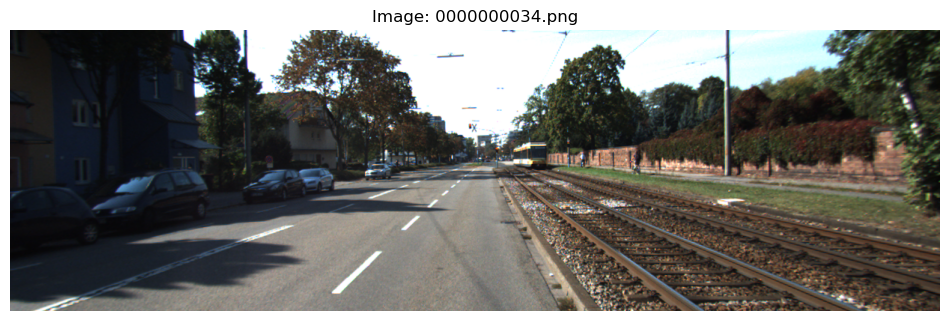

In [4]:
def load_and_display_image(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(12, 8))
    plt.imshow(img)
    plt.title(f'Image: {os.path.basename(image_path)}')
    plt.axis('off')
    plt.show()
    
ex_image_path = os.path.join(dataset_image_path_list[0], os.listdir(dataset_image_path_list[0])[0])

if os.path.exists(ex_image_path):
    load_and_display_image(ex_image_path)

## 3. 포인트 클라우드 데이터 확인
- LiDAR로 생성한 단일 프레임의 포인트 클라우드 시각화

In [5]:
# 포인트 로딩
def load_velodyne_points(path):
    points = np.fromfile(path, dtype=np.float32).reshape(-1, 4)
    return points[:, :3]

ex_velodyne_path = os.path.join(dataset_velodyne_path, os.listdir(dataset_velodyne_path)[0])
points = load_velodyne_points(ex_velodyne_path)

# Plotly 3D scatter plot
scatter = go.Scatter3d(
    x=points[:, 0], y=points[:, 1], z=points[:, 2],
    mode='markers',
    marker=dict(size=1, color=points[:, 2], colorscale='Viridis', opacity=0.7)
)

layout = go.Layout(
    margin=dict(l=0, r=0, b=0, t=0),
    scene=dict(
        xaxis_title='X', yaxis_title='Y', zaxis_title='Z',
        aspectmode='data'
    )
)

fig = go.Figure(data=[scatter], layout=layout)
fig.show()


## 4. 포인터 클라우드 정합 및 Ego-pose trajectory 시각화
- 지정한 프레임 수와 프레임 간격에 따라 포인트 클라우드 정합 
- GPS/IMU 데이터 활용

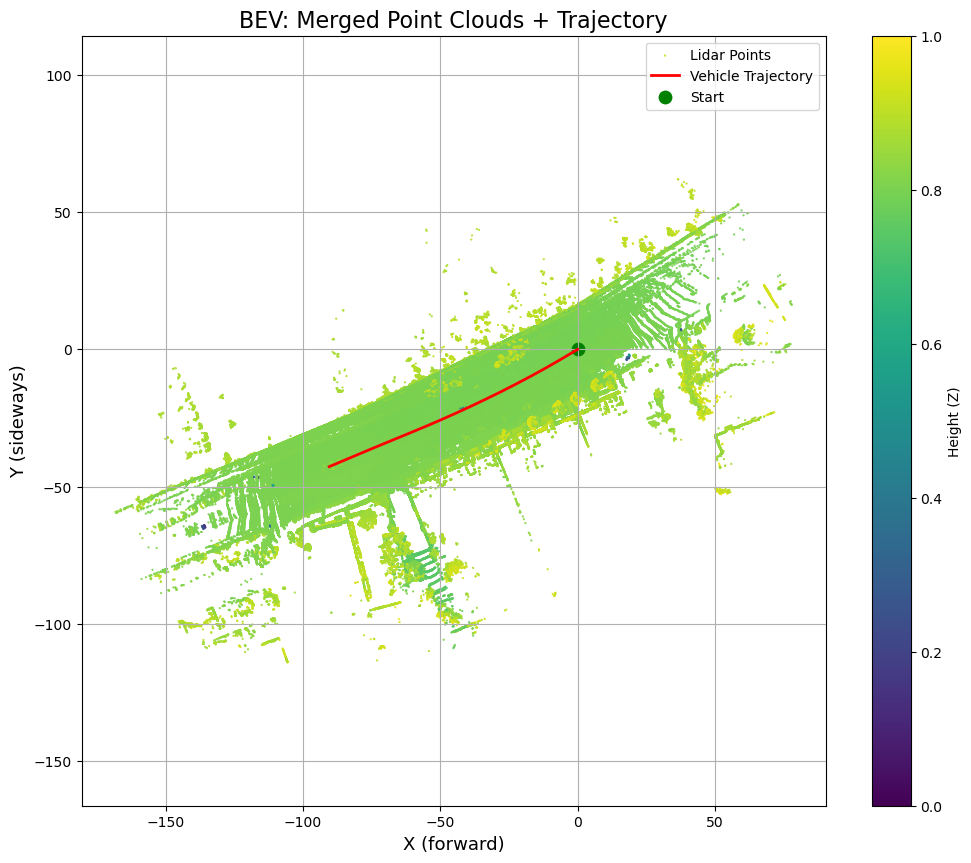

In [6]:
num_frames = 20        # 총 사용할 프레임 수
frame_interval = 5     # 프레임 간격 (5프레임마다)

# 위도/경도를 XYZ로 변환
def latlon_to_xyz(lat, lon, alt, ref_lat, ref_lon, ref_alt):
    R = 6378137.0  # Earth radius in meters
    x = (lon - ref_lon) * np.cos(np.radians(ref_lat)) * R * np.pi / 180
    y = (lat - ref_lat) * R * np.pi / 180
    z = alt - ref_alt
    return np.array([x, y, z])

# 포인트 클라우드 로드 함수
def load_velodyne_points(file_path):
    points = np.fromfile(file_path, dtype=np.float32).reshape(-1, 4)
    return points[:, :3]

# OXTS 데이터 로드 함수
def load_oxts(file_path):
    with open(file_path, 'r') as f:
        data = list(map(float, f.readline().strip().split()))
    return {
        'lat': data[0],
        'lon': data[1],
        'alt': data[2],
        'roll': data[3],
        'pitch': data[4],
        'yaw': data[5]
    }

# 회전 행렬 생성
def euler_to_rotmat(roll, pitch, yaw):
    Rx = np.array([
        [1, 0, 0],
        [0, np.cos(roll), -np.sin(roll)],
        [0, np.sin(roll),  np.cos(roll)]
    ])
    Ry = np.array([
        [np.cos(pitch), 0, np.sin(pitch)],
        [0, 1, 0],
        [-np.sin(pitch), 0, np.cos(pitch)]
    ])
    Rz = np.array([
        [np.cos(yaw), -np.sin(yaw), 0],
        [np.sin(yaw),  np.cos(yaw), 0],
        [0, 0, 1]
    ])
    return Rz @ Ry @ Rx


# 파일 정렬
velo_files = sorted(glob(os.path.join(dataset_velodyne_path, '*.bin')))
oxts_files = sorted(glob(os.path.join(dataset_oxts_path, '*.txt')))

# --- 초기 참조 위치 확보 ---
ref_oxts = load_oxts(oxts_files[0])
ref_lat, ref_lon, ref_alt = ref_oxts['lat'], ref_oxts['lon'], ref_oxts['alt']

# --- 정합 포인트와 궤적 저장 ---
all_points = []
trajectory = []

for i in range(0, num_frames * frame_interval, frame_interval):
    if i >= len(velo_files): break
    
    points = load_velodyne_points(velo_files[i])
    oxts = load_oxts(oxts_files[i])
    
    t = latlon_to_xyz(oxts['lat'], oxts['lon'], oxts['alt'], ref_lat, ref_lon, ref_alt)
    R = euler_to_rotmat(oxts['roll'], oxts['pitch'], oxts['yaw'])
    
    # 변환 행렬
    pose = np.eye(4)
    pose[:3, :3] = R
    pose[:3, 3] = t

    # 포인트 정합
    points_hom = np.hstack((points, np.ones((points.shape[0], 1))))
    transformed = (pose @ points_hom.T).T[:, :3]
    all_points.append(transformed)

    # 궤적 기록
    trajectory.append(t)

# --- 시각화 (BEV) ---
all_points = np.vstack(all_points)
trajectory = np.array(trajectory)

plt.figure(figsize=(12, 10))
plt.scatter(all_points[:, 0], all_points[:, 1], c=all_points[:, 2], s=0.3, cmap='viridis', label='Lidar Points')
plt.plot(trajectory[:, 0], trajectory[:, 1], color='red', linewidth=2, label='Vehicle Trajectory')
plt.scatter(trajectory[0, 0], trajectory[0, 1], color='green', s=80, label='Start')
plt.title("BEV: Merged Point Clouds + Trajectory", fontsize=16)
plt.xlabel("X (forward)", fontsize=13)
plt.ylabel("Y (sideways)", fontsize=13)
plt.axis("equal")
plt.grid(True)
plt.colorbar(label="Height (Z)")
plt.legend()
plt.show()

## 5. 캘리브레이션 데이터를 활용한 포인트 클라우드의 이미지 투영
- Camera 파라미터를 활용하여 라이다 포인트 클라우드를 이미지 에 투영

프레임 64 시각화 중...


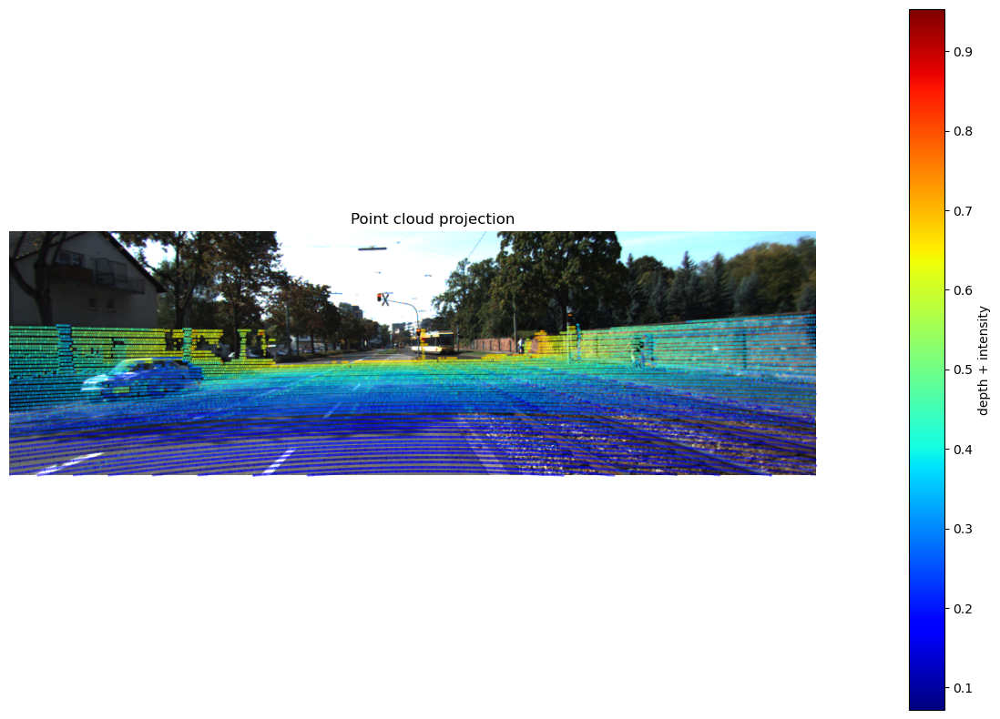

프레임 77 시각화 중...


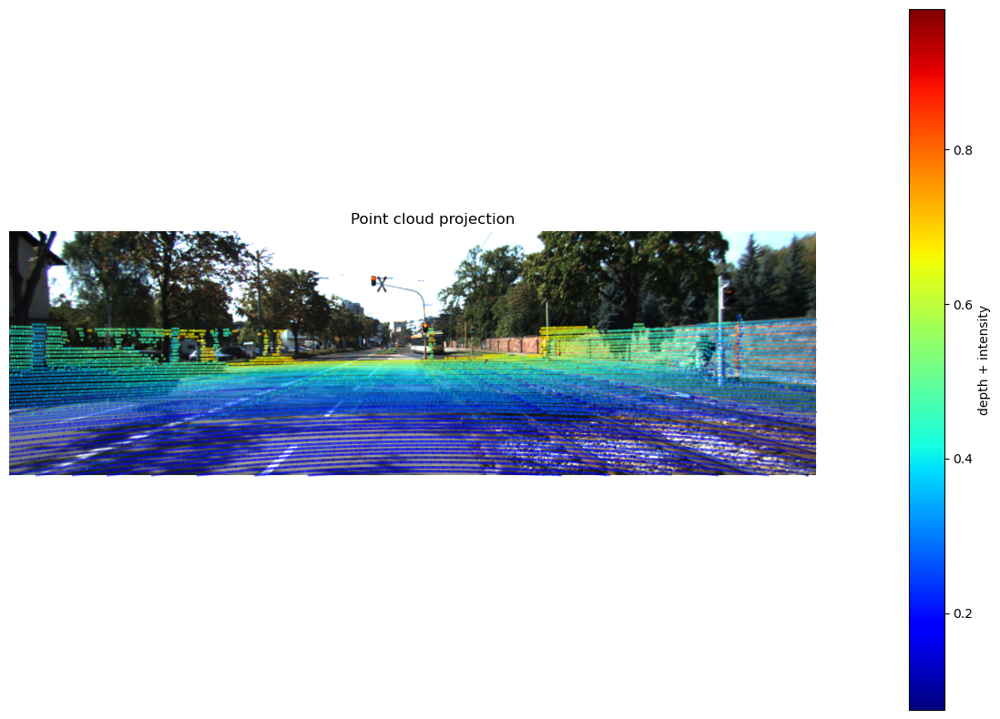

프레임 0 시각화 중...


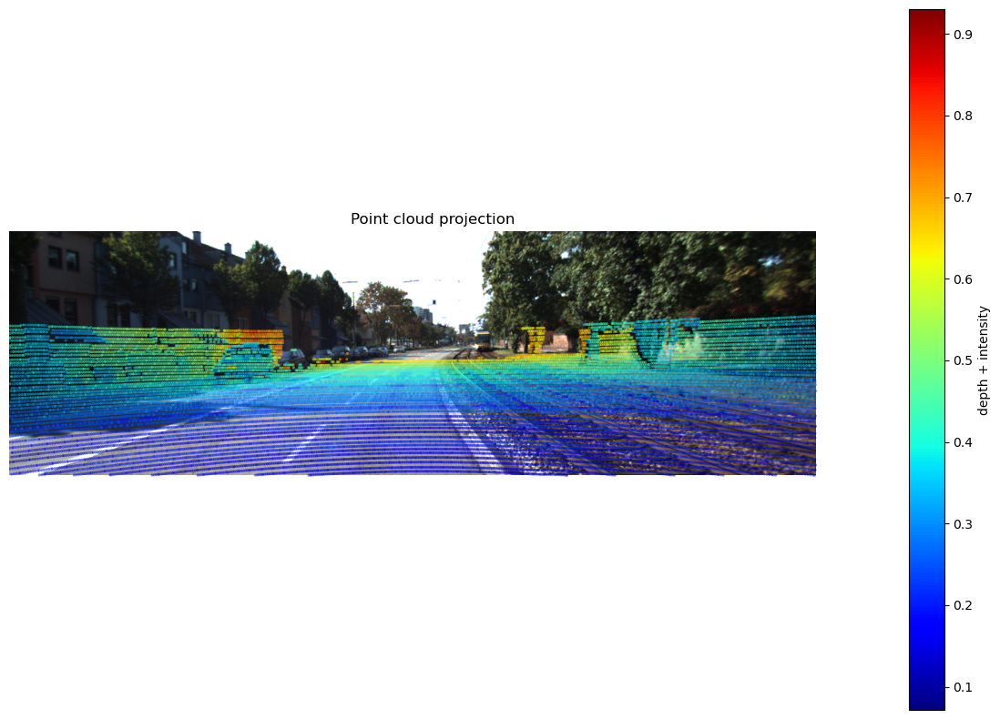

: 

In [ ]:
def load_calibration(calib_path):
    """캘리브레이션 데이터 로드"""
    calib_data = {}
    with open(calib_path, 'r') as f:
        for line in f:
            if line.strip():
                key, value = line.split(':', 1)
                key = key.strip()
                value = value.strip()
                if key.startswith('calib_time'):
                    continue  # 시간 정보는 건너뛰기
                try:
                    calib_data[key] = np.array([float(x) for x in value.split()])
                except ValueError:
                    continue  # 변환할 수 없는 값은 건너뛰기
    return calib_data

def load_velodyne_points(file_path):
    """포인트 클라우드 데이터 로드"""
    points = np.fromfile(file_path, dtype=np.float32).reshape(-1, 4)
    return points

def project_points_to_image(points, P, R_rect, Tr_velo_to_cam):
    """포인트 클라우드를 이미지 좌표로 투영"""
    # 포인트 클라우드를 동차 좌표로 변환
    points_h = np.hstack((points[:, :3], np.ones((points.shape[0], 1))))
    
    # Velodyne 좌표계에서 카메라 좌표계로 변환
    points_cam = (Tr_velo_to_cam @ points_h.T).T
    
    # R_rect 적용
    points_rect = (R_rect @ points_cam.T).T
    
    # 이미지 좌표로 투영
    points_proj = (P @ points_rect.T).T
    
    # 동차 좌표를 정규화
    points_proj = points_proj[:, :2] / points_proj[:, 2:3]
    
    # 깊이 정보 저장
    depths = points_rect[:, 2]
    
    return points_proj, depths

def visualize_projection(image_path, points_proj, points_intensity, depths):
    """투영된 포인트를 이미지 위에 시각화"""
    # 이미지 로드
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # 이미지 크기
    height, width = img.shape[:2]
    
    # 이미지 내부에 있는 포인트만 선택
    mask = (points_proj[:, 0] >= 0) & (points_proj[:, 0] < width) & \
           (points_proj[:, 1] >= 0) & (points_proj[:, 1] < height)
    
    points_proj = points_proj[mask]
    points_intensity = points_intensity[mask]
    depths = depths[mask]
    
    # 깊이 기반 필터링 (너무 멀리 있는 포인트 제거)
    depth_mask = (depths > 0) & (depths < 50)  # 50m 이내의 포인트만 선택
    points_proj = points_proj[depth_mask]
    points_intensity = points_intensity[depth_mask]
    depths = depths[depth_mask]
    
    # 깊이 기반 포인트 크기 조정
    point_sizes = np.clip(10.0 / (depths + 1e-6), 5.0, 20.0)
    
    # 시각화
    plt.figure(figsize=(15, 10))
    plt.imshow(img)
    
    # 깊이에 따른 투명도 조정
    alpha = np.clip(1.0 / (depths + 1e-6), 0.5, 1.0)
    
    # 깊이와 반사도를 결합한 색상 매핑
    # 깊이를 0-1 범위로 정규화
    normalized_depths = np.clip(depths / 50.0, 0, 1)
    
    # 깊이와 반사도를 결합 (깊이: 0.7, 반사도: 0.3 비중)
    combined_values = 0.7 * normalized_depths + 0.3 * points_intensity
    
    scatter = plt.scatter(points_proj[:, 0], points_proj[:, 1], 
                         c=combined_values, cmap='jet',  # jet 컬러맵 사용
                         s=point_sizes, alpha=alpha, edgecolors='none')
    
    plt.colorbar(scatter, label='depth + intensity')
    plt.title('Point cloud projection')
    plt.axis('off')
    plt.show()
    
    
# 경로 설정
calib_cam_path = os.path.join(dataset_calib_path, "calib_cam_to_cam.txt")
calib_velo_path = os.path.join(dataset_calib_path, "calib_velo_to_cam.txt")

# 캘리브레이션 데이터 로드
calib_cam = load_calibration(calib_cam_path)
calib_velo = load_calibration(calib_velo_path)

# 필요한 변환 행렬 추출
P = calib_cam['P_rect_02'].reshape(3, 4)  # 카메라 2의 투영 행렬
R_rect = np.eye(4)
R_rect[:3, :3] = calib_cam['R_rect_00'].reshape(3, 3)

# Velodyne에서 카메라로의 변환 행렬 구성
R_velo = calib_velo['R'].reshape(3, 3)
T_velo = calib_velo['T'].reshape(3, 1)
Tr_velo_to_cam = np.eye(4)
Tr_velo_to_cam[:3, :3] = R_velo
Tr_velo_to_cam[:3, 3] = T_velo.flatten()

# 랜덤한 프레임 선택
num_frames = 3
frame_indices = np.random.choice(100, num_frames, replace=False)

for frame_idx in frame_indices:
    # 파일 경로
    velodyne_path = os.path.join(dataset_velodyne_path, f'{frame_idx:010d}.bin')
    image_path = os.path.join(dataset_image_path_list[0], f'{frame_idx:010d}.png')

    if not os.path.exists(velodyne_path) or not os.path.exists(image_path):
        print(f"프레임 {frame_idx}의 파일이 존재하지 않습니다.")
        continue
    
    # 포인트 클라우드 로드
    points = load_velodyne_points(velodyne_path)
    
    # 포인트 클라우드를 이미지 좌표로 투영
    points_proj, depths = project_points_to_image(points, P, R_rect, Tr_velo_to_cam)
    
    # 시각화
    print(f"프레임 {frame_idx} 시각화 중...")
    visualize_projection(image_path, points_proj, points[:, 3], depths)
